# International Trade and Environmental Pollution

This notebook contains an analysis based on the University of Gothenburg's Quality of Government (QoG) Dataset. The primary focus is on understanding the interactions between international trade, economic growth, and environmental pollution over the past 50 years across different countries.

In [1]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
from plotly import express as px
from plotly.subplots import make_subplots

## Loading and Previewing the Economics and Politics Dataset

The following code reads the `Economics and Politics.csv` file, which contains data related to economic and political factors. We use `pd.read_csv` to load the dataset into a DataFrame named `poli` and then call the `.head()` function to display the first five rows of the dataset, allowing us to inspect the initial structure of the data.

In [2]:
poli = pd.read_csv('Economics and Politics.csv')
poli.head()

,ccode,cname,year,ccode_qog,cname_qog,ccodealp,ccodecow,version,cname_year,ccodealp_year,...,wdi_trade,wdi_unempfilo,wdi_unempilo,wdi_unempmilo,wdi_unempyfilo,wdi_unempyilo,wdi_unempymilo,wdi_wip,who_sanittot,whr_hap
0,4,Afghanistan,1946,4,Afghanistan,AFG,700.0,QoGBasTSjan24,Afghanistan 1946,AFG46,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4,Afghanistan,1947,4,Afghanistan,AFG,700.0,QoGBasTSjan24,Afghanistan 1947,AFG47,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4,Afghanistan,1948,4,Afghanistan,AFG,700.0,QoGBasTSjan24,Afghanistan 1948,AFG48,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,Afghanistan,1949,4,Afghanistan,AFG,700.0,QoGBasTSjan24,Afghanistan 1949,AFG49,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,Afghanistan,1950,4,Afghanistan,AFG,700.0,QoGBasTSjan24,Afghanistan 1950,AFG50,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Filtering and Selecting Key Variables

In this section, we:
1. Create a new DataFrame `poli2` by selecting key variables such as country name, year, population, exports, imports, total trade, CO2 emissions, financial trade intensity, and trade as a percentage of GDP from the original dataset `poli`.
2. Filter the data to include only the most recent 50 years (from 1973 to 2023) by using a condition that compares the `year` variable with the calculated value `(current_year - recent_years)`.
3. Display the first five rows of the filtered and refined DataFrame `poli2` to preview the selected variables and filtered data.

In [3]:
poli2 = poli[['cname','year','gle_pop','gle_exp','gle_imp','gle_trade','dr_eg','fi_ftradeint','wdi_trade']]
# Filter for the recent 50 years
recent_years = 50  
current_year = 2023  

# Filter data for the recent 50 years
poli2 = poli[poli['year'] >= (current_year - recent_years)][['cname', 'year', 'gle_pop', 'wdi_trade','gle_exp', 'gle_imp', 'gle_trade', 'dr_eg', 'fi_ftradeint']]


poli2.head()
poli2.head()

,cname,year,gle_pop,wdi_trade,gle_exp,gle_imp,gle_trade,dr_eg,fi_ftradeint
27,Afghanistan,1973,14724.0,27.692309,236.03999,164.31000,400.35001,29.045788,NaN
28,Afghanistan,1974,15070.0,28.865980,295.98001,235.75999,531.72998,27.462164,NaN
29,Afghanistan,1975,15378.0,26.948358,342.07999,235.80000,577.87000,28.180368,NaN
30,Afghanistan,1976,15653.0,28.086957,447.60001,310.82001,758.41998,24.830343,NaN
31,Afghanistan,1977,15892.0,26.486080,604.34003,327.23001,931.57001,28.050037,NaN


## Loading and Previewing the Environmental Indicators Dataset

The following code reads the `Environmental Indicators.csv` file, which contains data on environmental metrics and indicators across various countries. We use `pd.read_csv` to load the dataset into a DataFrame named `envi`. After loading the data, we call the `.head()` function to display the first five rows, allowing us to inspect the structure and content of the environmental dataset.


In [4]:
envi = pd.read_csv('Environmental Indicators.csv')

envi.head()

,Unnamed: 0,cname,ccode,year,cname_qog,ccode_qog,ccodealp,ccodealp_year,ccodecow,ccodevdem,...,wdi_precip,wdi_tpa,wvs_ameop,wvs_ceom,wvs_deop,wvs_epmip,wvs_epmpp,wvs_imeop,wvs_pedp,wvs_ploem
0,1,Afghanistan,4.0,1946,Afghanistan,4,AFG,AFG46,700.0,36.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,Afghanistan,4.0,1947,Afghanistan,4,AFG,AFG47,700.0,36.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,Afghanistan,4.0,1948,Afghanistan,4,AFG,AFG48,700.0,36.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,Afghanistan,4.0,1949,Afghanistan,4,AFG,AFG49,700.0,36.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,Afghanistan,4.0,1950,Afghanistan,4,AFG,AFG50,700.0,36.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
#Merging Data Sets
envi2 = envi[['cname','year','ccl_nmitlp','ccl_leglp','ccci_em','edgar_co2t','epi_epi']]

envi2.head()

,cname,year,ccl_nmitlp,ccl_leglp,ccci_em,edgar_co2t,epi_epi
0,Afghanistan,1946,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,1947,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,1948,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,1949,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,1950,NaN,NaN,NaN,NaN,NaN


In [6]:
merged_data = pd.merge(poli2, envi2, how = 'inner', on = ['cname', 'year'])

#Drop columns with all NaN Values
merged_data = merged_data.dropna(axis = 1, how = 'all')

#Drop rows with all NaN Values
merged_data = merged_data.dropna(axis = 0, how = 'all')

merged_data.head()

,cname,year,gle_pop,wdi_trade,gle_exp,gle_imp,gle_trade,dr_eg,fi_ftradeint,ccl_nmitlp,ccl_leglp,ccci_em,edgar_co2t,epi_epi
0,Afghanistan,1973,14724.0,27.692309,236.03999,164.31000,400.35001,29.045788,NaN,NaN,NaN,NaN,1.486272,NaN
1,Afghanistan,1974,15070.0,28.865980,295.98001,235.75999,531.72998,27.462164,NaN,NaN,NaN,NaN,1.913149,NaN
2,Afghanistan,1975,15378.0,26.948358,342.07999,235.80000,577.87000,28.180368,NaN,NaN,NaN,NaN,1.713586,NaN
3,Afghanistan,1976,15653.0,28.086957,447.60001,310.82001,758.41998,24.830343,NaN,NaN,NaN,NaN,1.630803,NaN
4,Afghanistan,1977,15892.0,26.486080,604.34003,327.23001,931.57001,28.050037,NaN,NaN,NaN,NaN,1.894227,NaN


# Variables

## QOG1

1. **cname:** Country
2. **year:** Year
3. **gle_pop:** Population 
4. **wdi_trade:** World Trade
5. **gle_exp:** Exports
6. **gle_imp:** Imports
7. **gle_trade:** Total Trade
8. **dr_eg:** Economic Globalization
9. **fi_ftradeint:** Freedom to Trade Internationally


## QOG2

1. **cname:** Country
2. **year:** Year
3. **ccl_nmitlp:** Number of climate change mitigation laws and policies
4. **ccl_leglp:** Climate change law in place
5. **edgar_co2t:** CO2 emissions total
6. **epi_epi:**  Environmental Performance Index

## 5 Plots


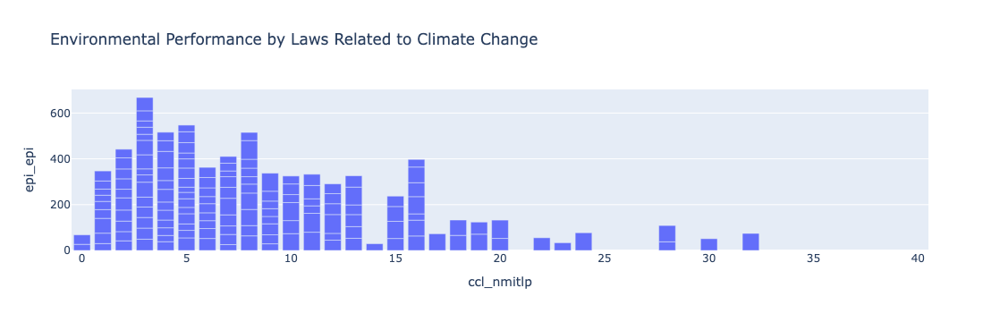

In [7]:
#Plot - 1
#Environmental Performance by Laws Related to Climate Change, with Hover Data of each Country
#Countries with a higher environmental performace have more laws relating to climate change

tab = merged_data.groupby(['ccl_nmitlp', 'cname'], as_index=False)['epi_epi'].mean()
fig = px.bar(
    data_frame=tab,
    x='ccl_nmitlp',
    y='epi_epi',
    title='Environmental Performance by Laws Related to Climate Change',
    hover_data=['cname']
)
fig.show()

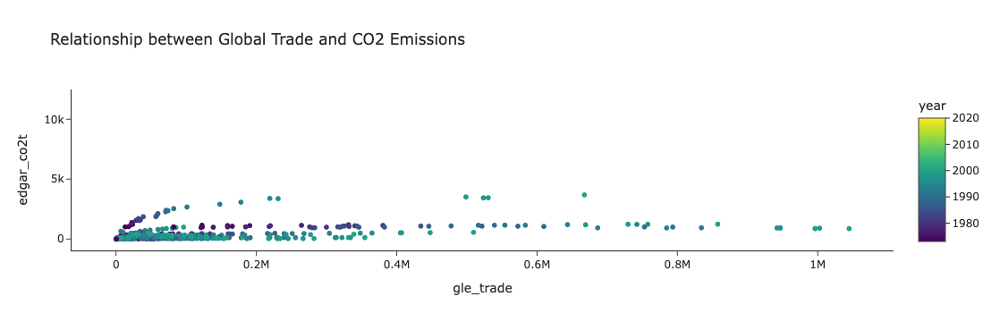

In [8]:
#Plot - 2
#Education x income + urban
fig = px.scatter(
    data_frame = merged_data,
    x = 'gle_trade',
    y = 'edgar_co2t',
    title = "Relationship between Global Trade and CO2 Emissions",
    color = 'year', # do color = 'variable'
    template = 'simple_white',
    hover_data = ['cname']
)
fig.show()

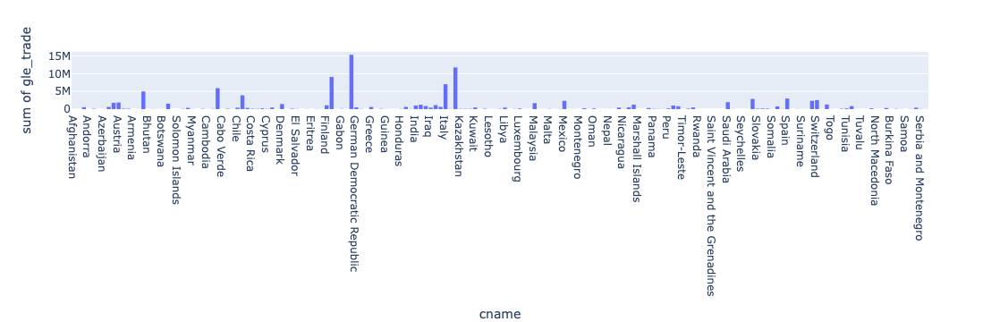

In [9]:
#Plot - 3
#GDP Data Per Country
g = px.histogram(data_frame = merged_data, x = 'cname',y = 'gle_trade', nbins = 10)
g.show()

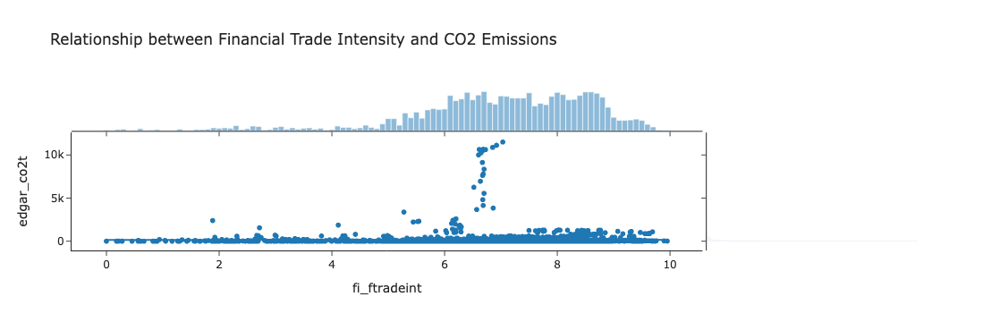

In [10]:
#Plot - 4
#Financial Trade Intensity and C02 Emissions
fig = px.scatter(
    merged_data,
    x="fi_ftradeint",
    y="edgar_co2t",
    title="Relationship between Financial Trade Intensity and CO2 Emissions",
    hover_data=['year', 'cname'],  
    marginal_x='histogram',  
    marginal_y='histogram',  
    template='simple_white',  
    trendline='ols'  
)

fig.show()

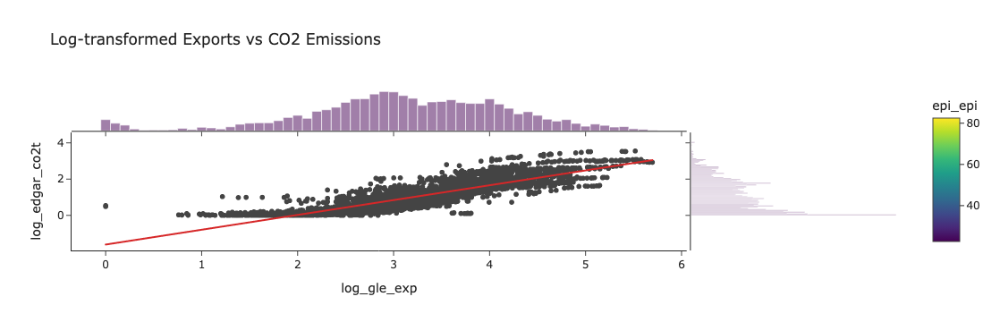

In [11]:
#Plot - 5
#Exports by C02 Emissions
fig = px.scatter(
    data_frame=merged_data.assign(
        log_gle_exp=np.log10(merged_data['gle_exp'] + 1),  # Apply log transformation
        log_edgar_co2t=np.log10(merged_data['edgar_co2t'] + 1)  # Apply log transformation
    ),
    x="log_gle_exp",  
    y="log_edgar_co2t",  
    title="Log-transformed Exports vs CO2 Emissions",
    hover_data=['cname'],  
    marginal_x='histogram',  
    marginal_y='histogram',  
    template='simple_white',  
    trendline='ols',
    color='epi_epi'
)

fig.show()